In [26]:
# conda base 

# Data manipulation 
import pandas as pd 
import numpy as np

# Data viz
import matplotlib.pyplot as plt 
from matplotlib.patches import Patch
import seaborn as sns

# ml
from scipy.spatial import distance
from sklearn.metrics import pairwise
from sklearn.cluster import KMeans

This notebook shows the patters in seq space when we mapp differentes propertiers

# load data and plot functions

In [2]:
# load seqs annots
df_annot = pd.read_csv("../results/tables/df_annot_all.csv", sep = "\t")

# load likelihoods from carp and merge dset
df_plm = pd.read_pickle("../results/embeddings/all_plm.pkl")

# rename onehot col
df_plm = df_plm.rename(columns={"onehot": "aa_composition"})

# merge data 
df_annot_plm = pd.merge(df_annot, df_plm, on = "seq_id")

# load tsne coords and merge annots
df_sbl = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_plm_sbl_esm1b.csv")
df_sbl = df_sbl.merge(df_annot_plm, on = "seq_id")
df_mbl = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_plm_mbl_esm1b.csv")
df_mbl = df_mbl.merge(df_annot_plm, on = "seq_id")

# per class datasets 
df_sbl_a = df_sbl[df_sbl.bla_class == "Class A"]
df_sbl_c = df_sbl[df_sbl.bla_class == "Class C"]
df_sbl_d = df_sbl[df_sbl.bla_class == "Class D"]

# distance 

In [10]:
# filter by class and sample 100 seqs
rand100_a = df_sbl_a.sample(100)
rand100_c = df_sbl_c.sample(100)
rand100_d = df_sbl_d.sample(100)

rand100_b1 = df_mbl[df_mbl.bla_subclass.str.contains("B1")].sample(100)
rand100_b2 = df_mbl[df_mbl.bla_subclass.str.contains("B2")].sample(100)
rand100_b3 = df_mbl[df_mbl.bla_subclass.str.contains("B3")].sample(100)

In [11]:
# export the data
# rand100_concat = pd.concat([rand100_a, rand100_c, rand100_d, rand100_b1, rand100_b2, rand100_b3])
# rand100_concat.to_pickle("../results/distance/rand600seqs.pkl")

In [3]:
# load data 
rand100_concat = pd.read_pickle("../results/distance/rand600seqs.pkl")

# split by superfam
rand100_sbl = rand100_concat[~rand100_concat.bla_class.str.contains("Class B")]
rand100_mbl = rand100_concat[rand100_concat.bla_subclass.str.contains("Class B1|Class B2|Class B3")]

# split data by class
rand100_a = rand100_sbl[rand100_sbl.bla_class == "Class A"]
rand100_c = rand100_sbl[rand100_sbl.bla_class == "Class C"]
rand100_d = rand100_sbl[rand100_sbl.bla_class == "Class D"]

rand100_b1 = rand100_mbl[rand100_mbl.bla_subclass == "Class B1"]
rand100_b2 = rand100_mbl[rand100_mbl.bla_subclass == "Class B2"]
rand100_b3 = rand100_mbl[rand100_mbl.bla_subclass == "Class B3"]

<AxesSubplot:xlabel='tSNE1_esm1b', ylabel='tSNE2_esm1b'>

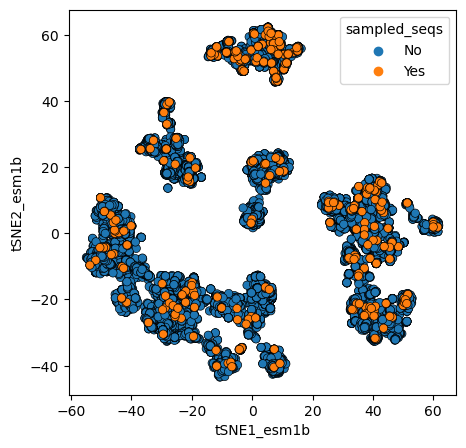

In [36]:
filters = [
    df_sbl.seq_id.isin(list(rand100_concat.seq_id)),
    ~df_sbl.seq_id.isin(list(rand100_concat.seq_id))
]

values = ["Yes", "No"]

df_sbl["sampled_seqs"] = np.select(filters, values)

plt.figure(figsize=(5,5))
sns.scatterplot(data = df_sbl.sort_values("sampled_seqs"), x = "tSNE1_esm1b", y = "tSNE2_esm1b", 
                hue = "sampled_seqs", edgecolor = "Black")

<AxesSubplot:xlabel='tSNE1_esm1b', ylabel='tSNE2_esm1b'>

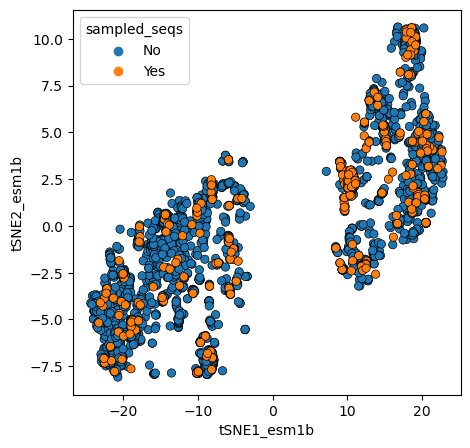

In [37]:
filters = [
    df_mbl.seq_id.isin(list(rand100_concat.seq_id)),
    ~df_mbl.seq_id.isin(list(rand100_concat.seq_id))
]

values = ["Yes", "No"]

df_mbl["sampled_seqs"] = np.select(filters, values)

plt.figure(figsize=(5,5))
sns.scatterplot(data = df_mbl.sort_values("sampled_seqs"), x = "tSNE1_esm1b", y = "tSNE2_esm1b", 
                hue = "sampled_seqs", edgecolor = "Black")

In [38]:
models = ['esm1b', 'esm', 'aa_composition', 't5xlu50', 't5bfd', 'xlnet', 'bepler', 'carp640M']

In [39]:
# quick example 
esm_embeddings = rand100_concat["esm1b"].tolist()

# A toy example
print("##################################")
print(f"embedding A: {esm_embeddings[0]} \n")
print(f"embedding B: {esm_embeddings[1]} \n")

print("##################################")
print(f"Euclidean distance of A vs A embedding = {distance.euclidean(esm_embeddings[0], esm_embeddings[0])} \n")
print(f"Euclidean distance of A vs B embedding = {distance.euclidean(esm_embeddings[0], esm_embeddings[1])} \n")

print("##################################")
print(f"Cosine distance of A vs A embedding = {distance.cosine(esm_embeddings[0], esm_embeddings[0])} \n")
print(f"Cosine distance of A vs B embedding = {distance.cosine(esm_embeddings[0], esm_embeddings[1])}")

##################################
embedding A: [ 0.11671111 -0.01534809 -0.05443087 ... -0.11924113  0.04374622
  0.07460255] 

embedding B: [ 0.15187375 -0.04086968 -0.1222755  ... -0.09754103  0.08479293
  0.08474218] 

##################################
Euclidean distance of A vs A embedding = 0.0 

Euclidean distance of A vs B embedding = 2.3874921798706055 

##################################
Cosine distance of A vs A embedding = 0 

Cosine distance of A vs B embedding = 0.00882631540298462


In [47]:
# create a plot fx
def plot_distance(df, model, name):
    
    # select the protein language model
    embeddings = df[model].tolist()
    
    # compute pairwise distances and cosine sim
    euclidean_distance = distance.cdist(embeddings, embeddings, "euclidean")
    cosine_distance    = distance.cdist(embeddings, embeddings, "cosine")
    cosine_similarity  = pairwise.cosine_similarity(embeddings, embeddings)
    
    # save it as a dict
    distances = {
        "Euclidean distance":euclidean_distance, 
        "Cosine similarity":cosine_similarity,
        "Cosine distance":cosine_distance
    }

    # create a panel
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    # plot the data 
    for i, (key, value) in enumerate(distances.items()):
        
        # convert the data to a df and plot it as a heatmap
        df_dist = pd.DataFrame(value, columns = df["bla_subclass"].tolist())
        sns.heatmap(df_dist, cmap = "cividis", yticklabels = False, ax = axs[i])
        axs[i].set_title(f"{key} | {model} | {name}", size = 9)
    
    # adjust the layout
    plt.tight_layout()
    plt.show()

/home/gama/anaconda3/lib/python3.9/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


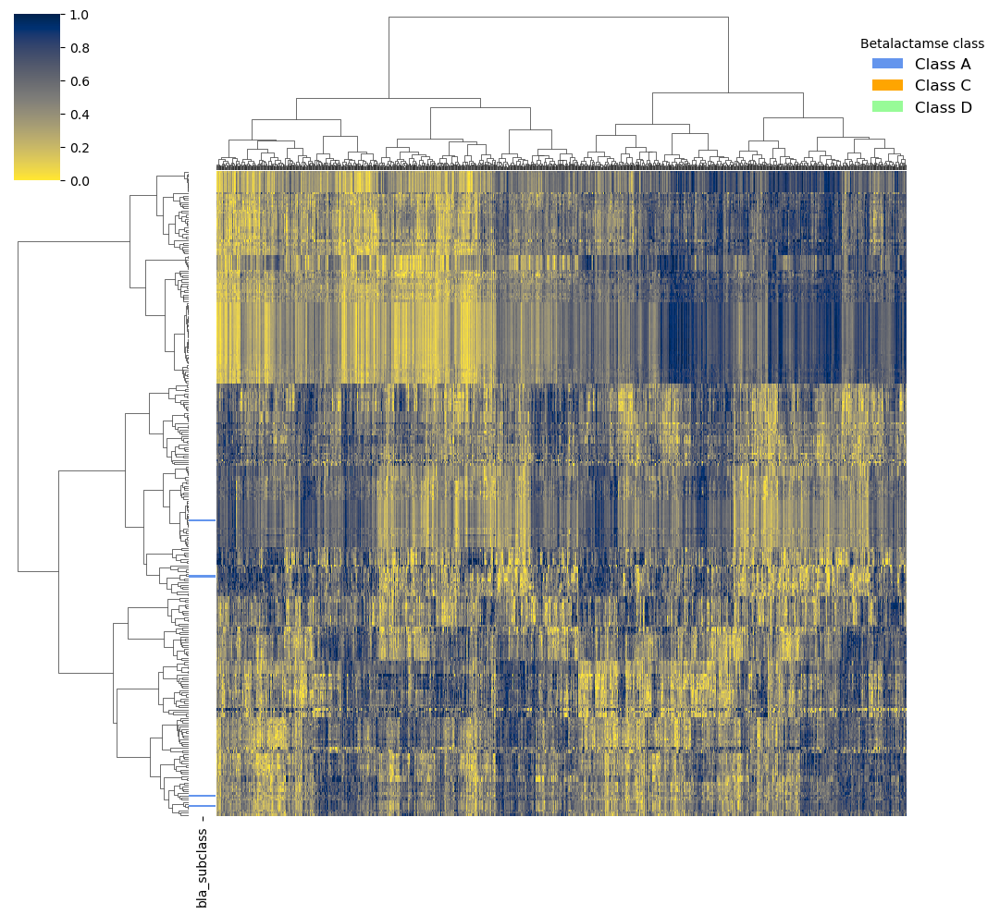

In [36]:
embeddings = pd.DataFrame(rand100_sbl.esm1b.to_list())

bla_colors = rand100_sbl.bla_subclass.map({
    'Class A':"cornflowerblue", 
    'Class C':"orange", 
    'Class D':"palegreen"
})

# create a color palette and handles
lut = dict(zip(rand100_sbl.bla_subclass.to_list(), bla_colors))
handles = [Patch(facecolor = lut[name]) for name in lut]

sns.clustermap(embeddings, method="ward", metric="euclidean", standard_scale=1, cmap = "cividis_r", 
               xticklabels=False, yticklabels=False,  row_colors=bla_colors)

plt.legend(
        handles, lut, 
        title = "Betalactamse class", loc = "upper left", 
        frameon = False, ncol = 1,
        bbox_to_anchor = (.92, .97), 
        bbox_transform = plt.gcf().transFigure, 
        prop = {'size': 12})     

## sbl

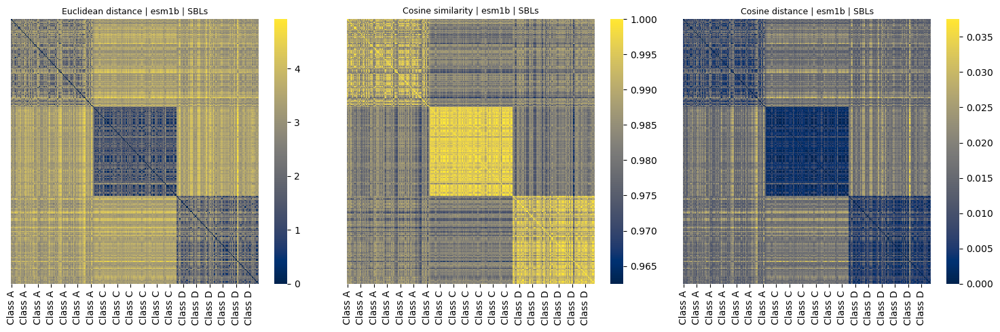

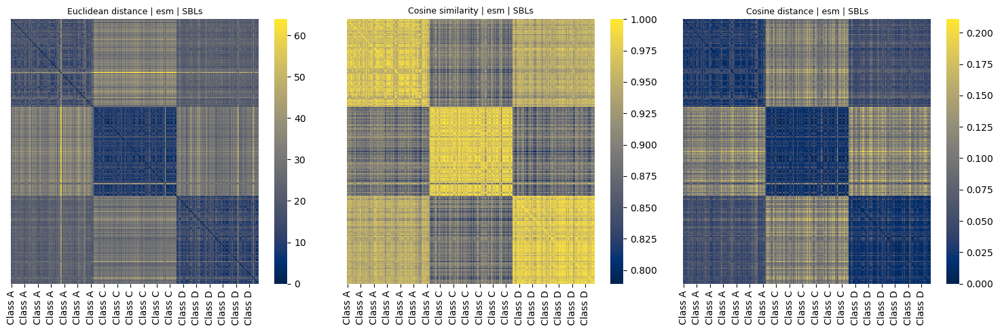

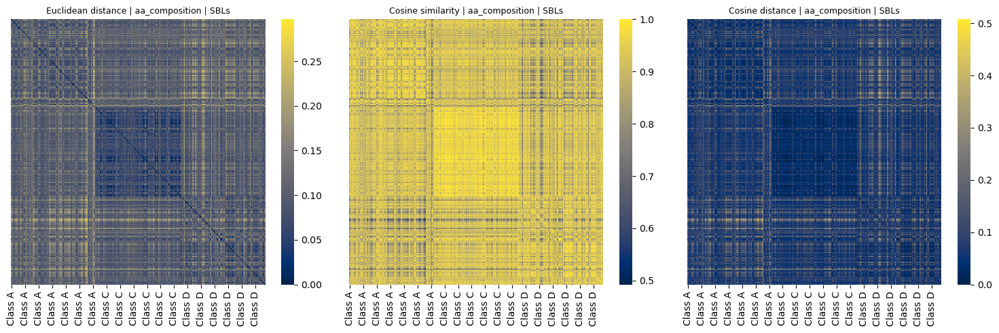

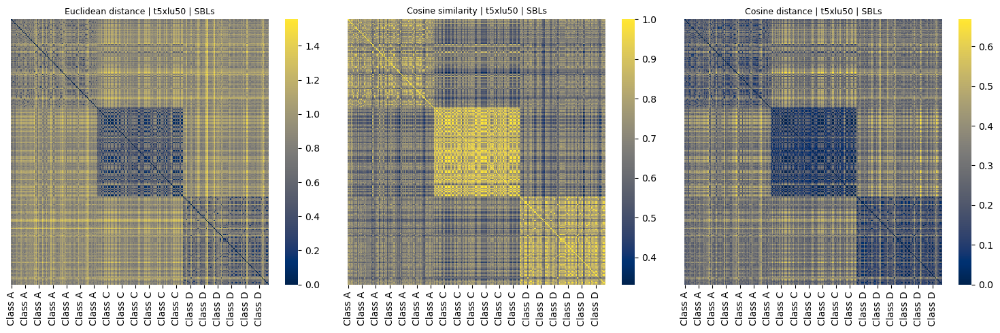

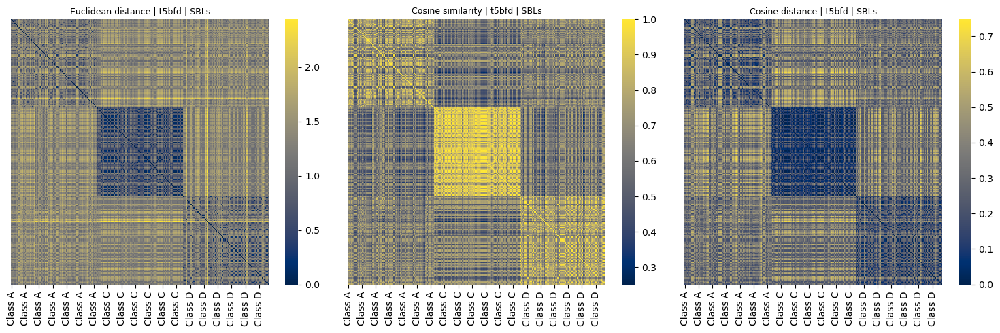

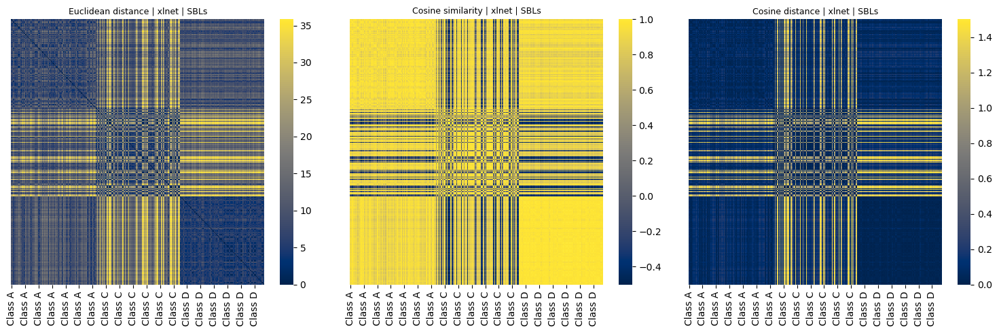

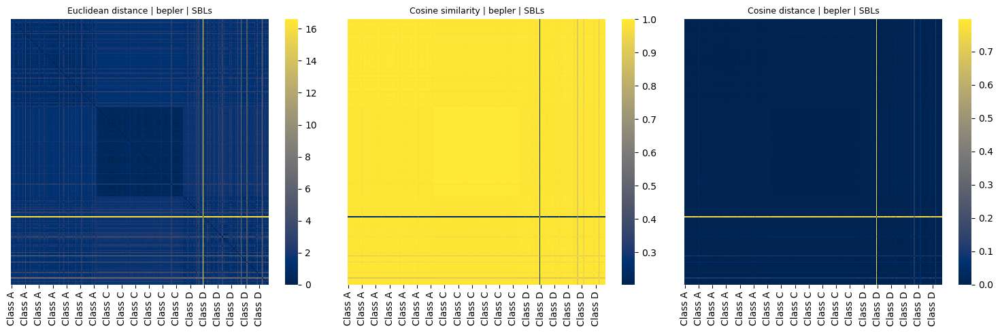

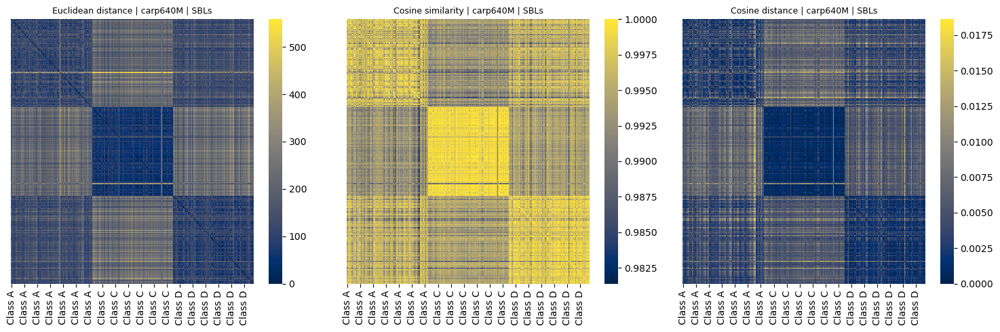

In [48]:
for model in models:
    plot_distance(rand100_sbl, model, "SBLs")

## mbl

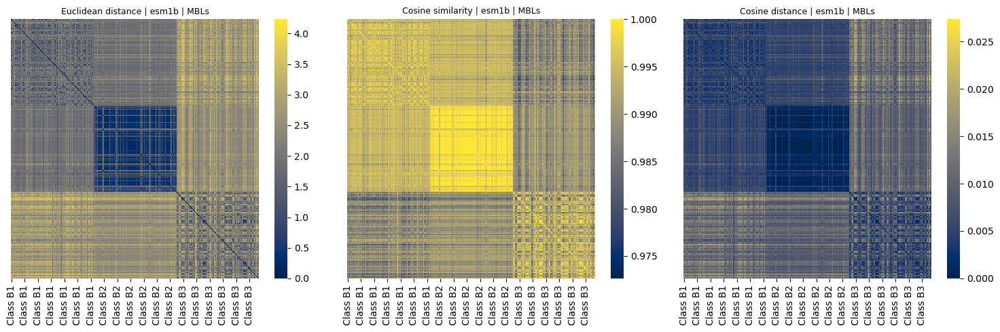

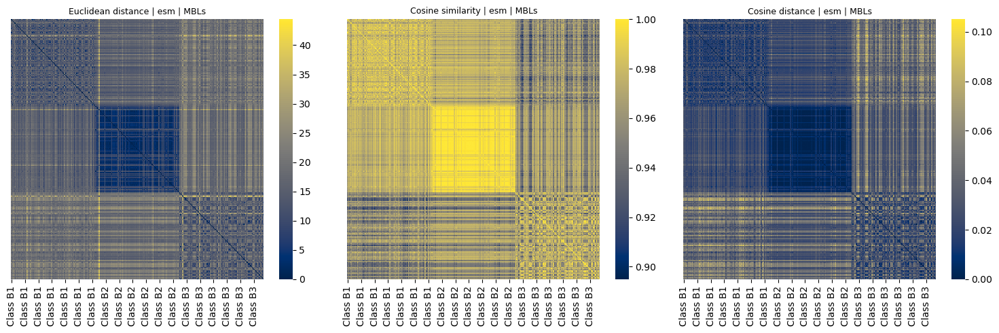

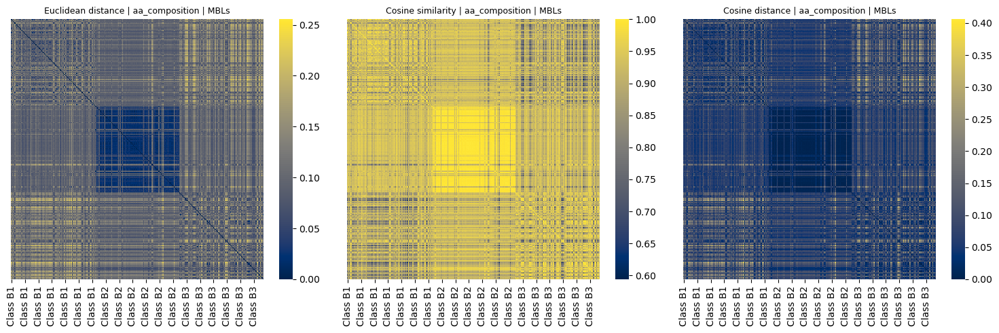

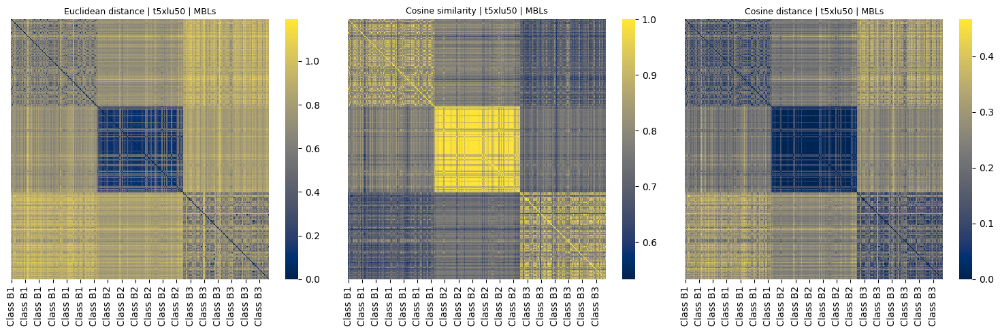

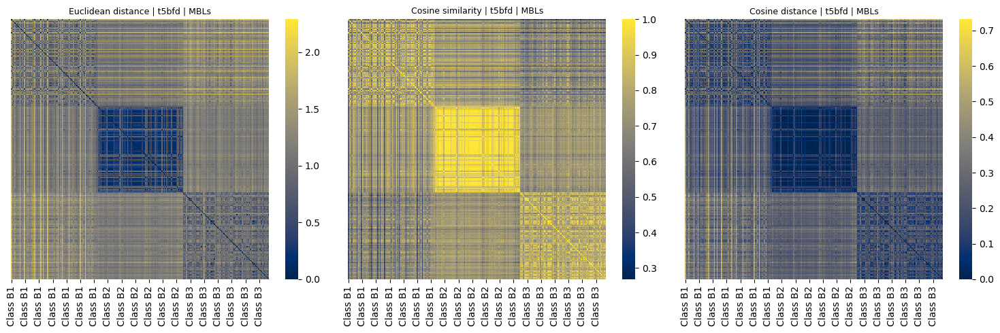

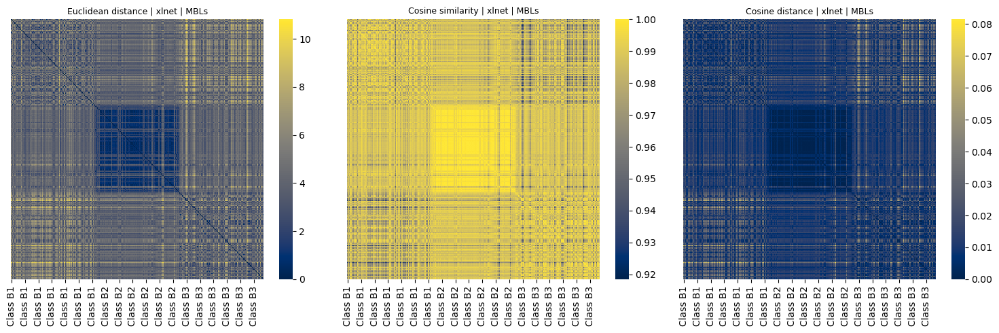

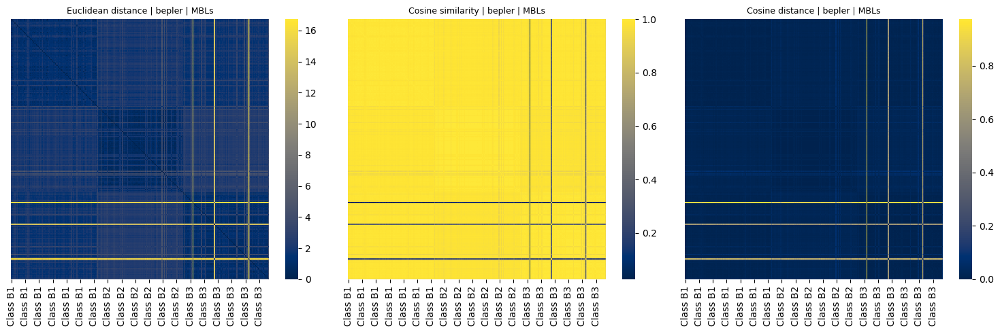

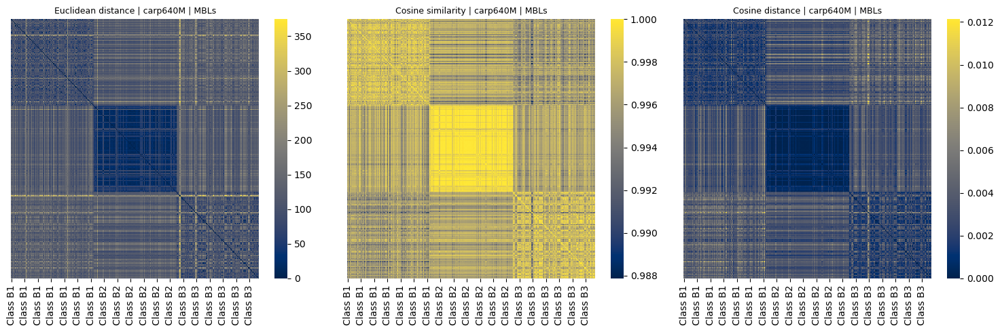

In [49]:
for model in models:
    plot_distance(rand100_b, model, "MBLs")

## class a

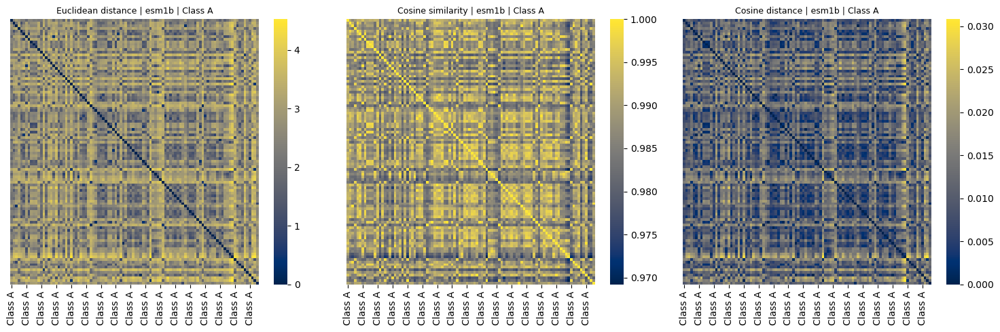

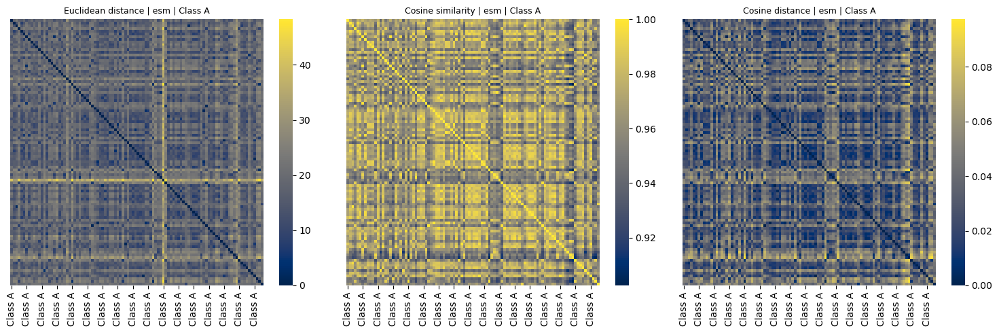

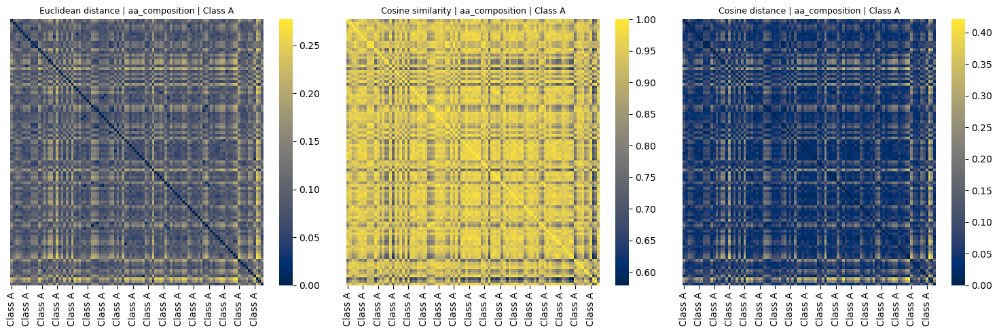

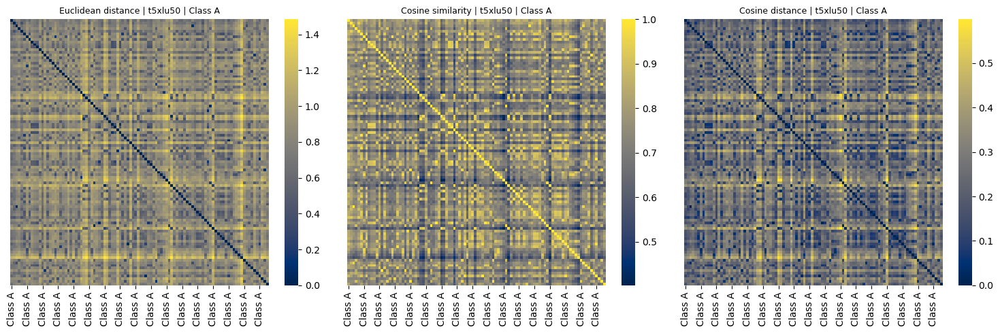

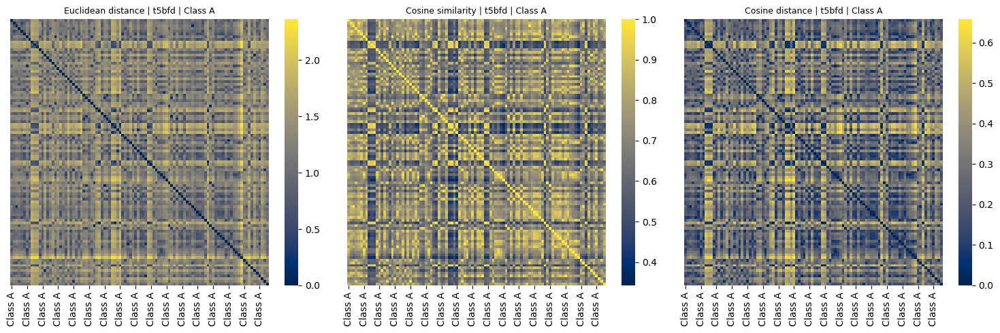

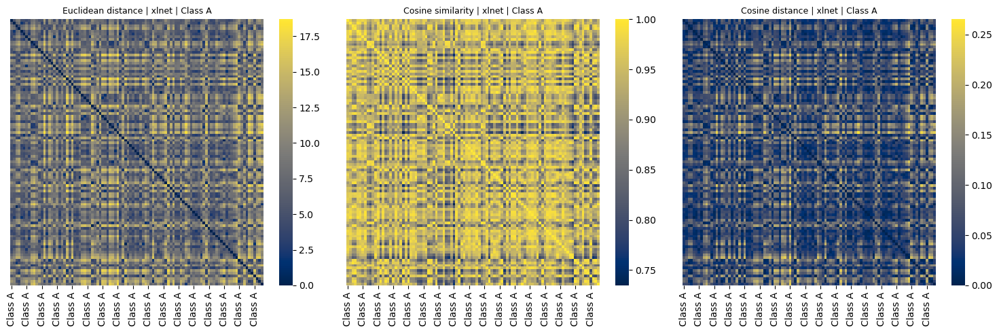

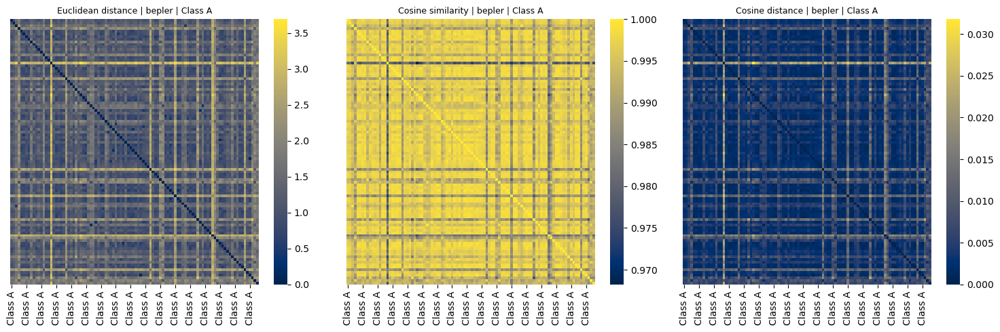

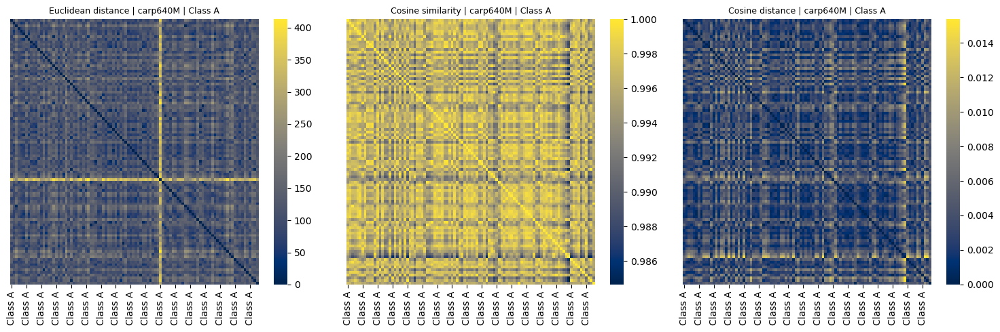

In [50]:
for model in models:
    plot_distance(rand100_a, model, "Class A")

## class C 

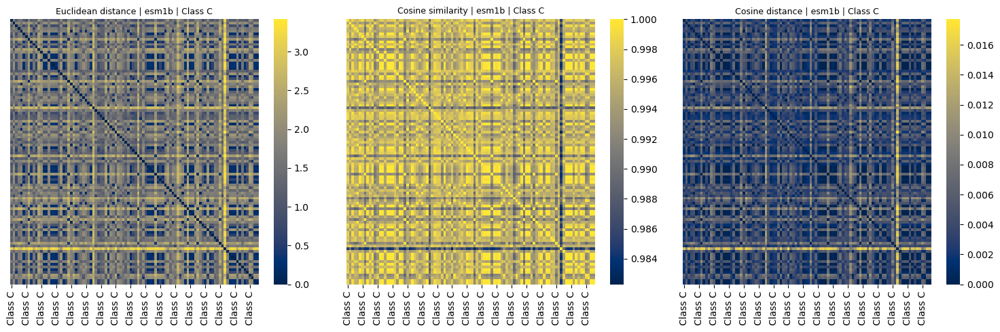

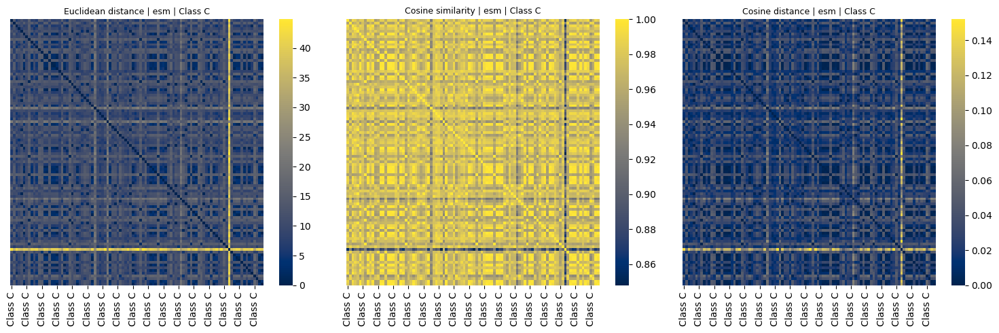

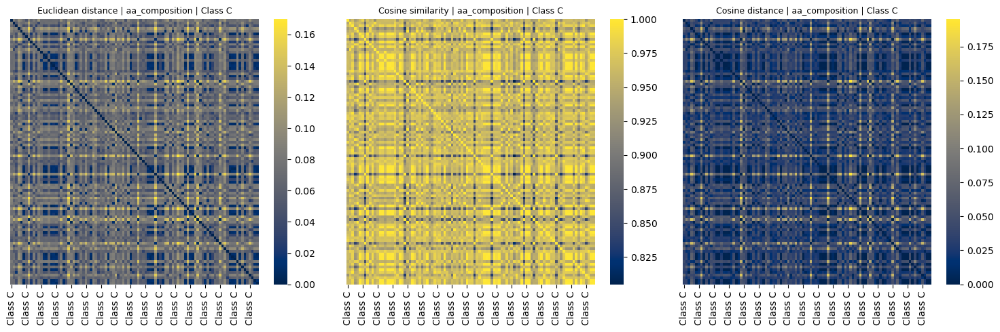

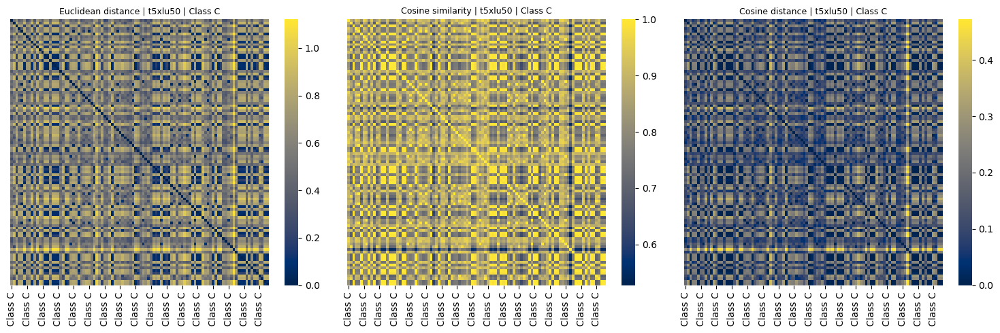

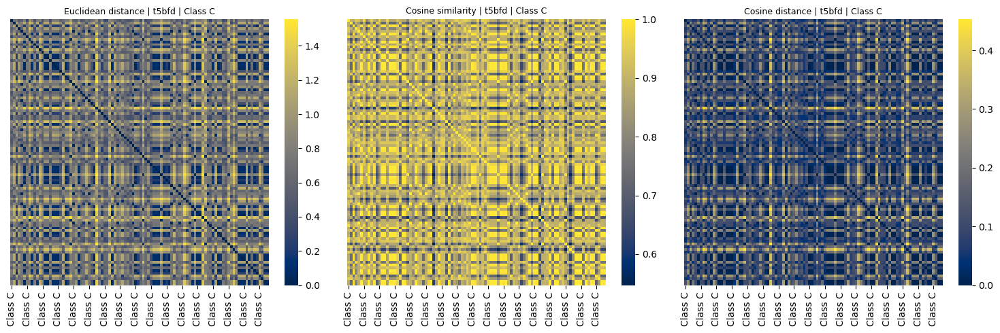

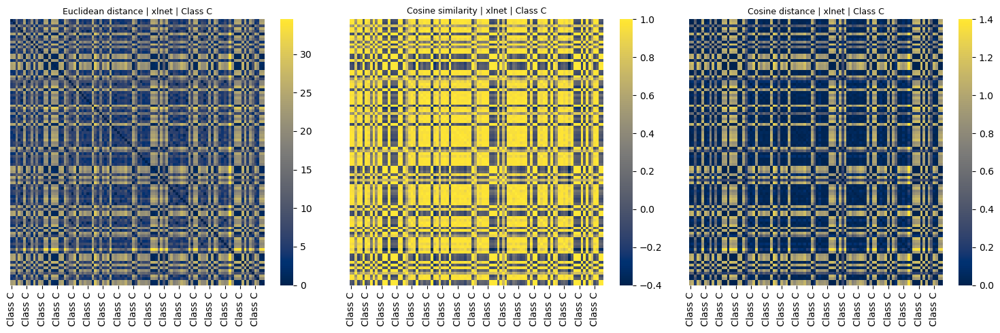

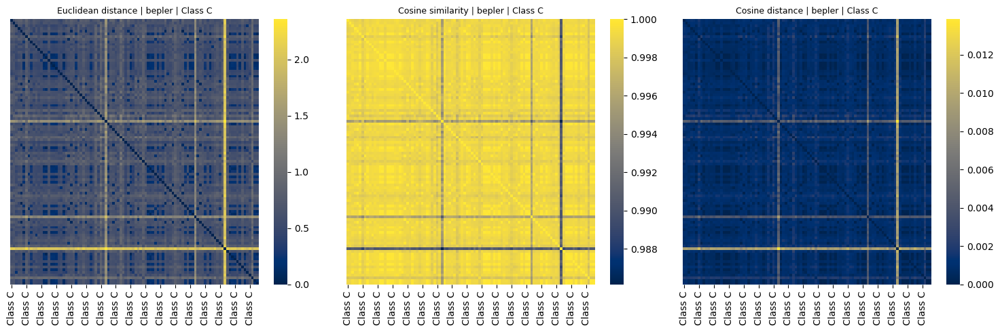

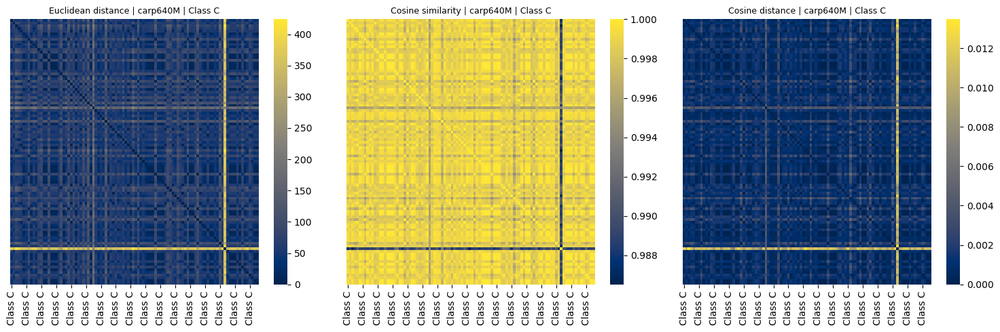

In [51]:
for model in models:
    plot_distance(rand100_c, model, "Class C")

## class D

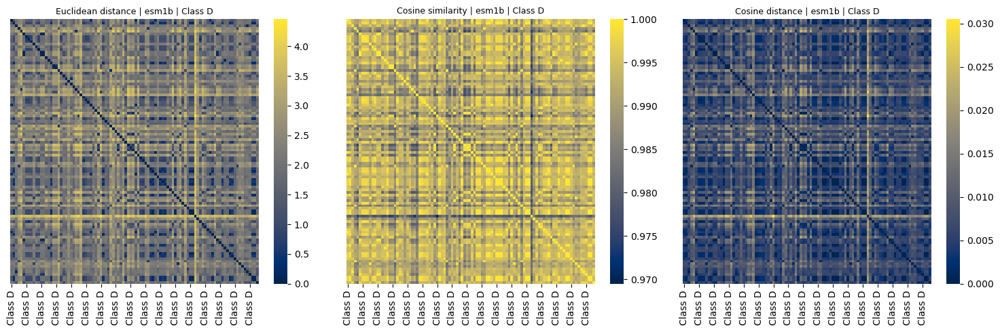

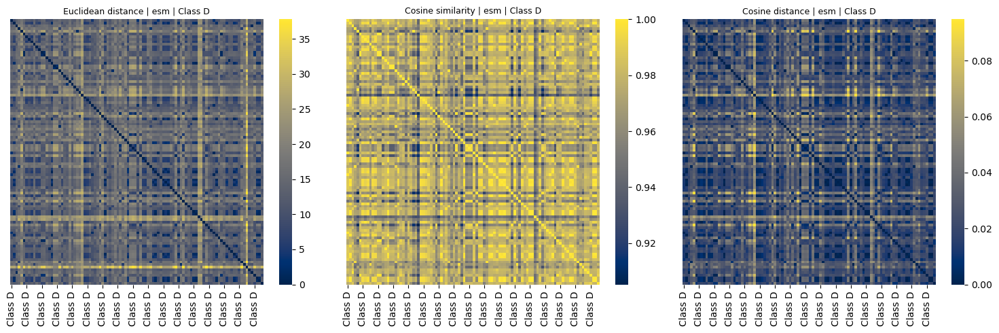

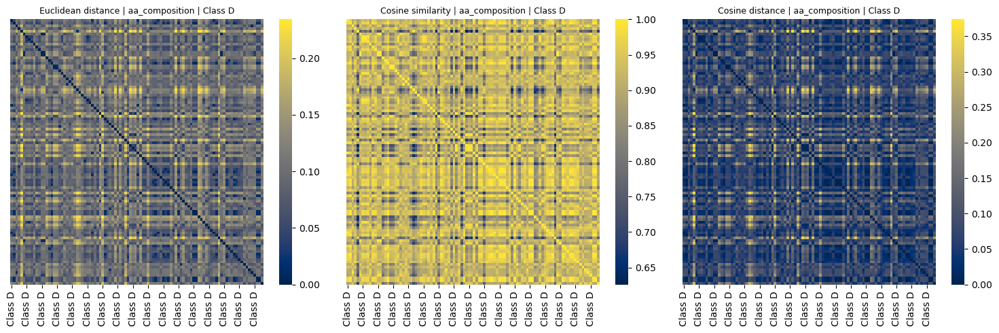

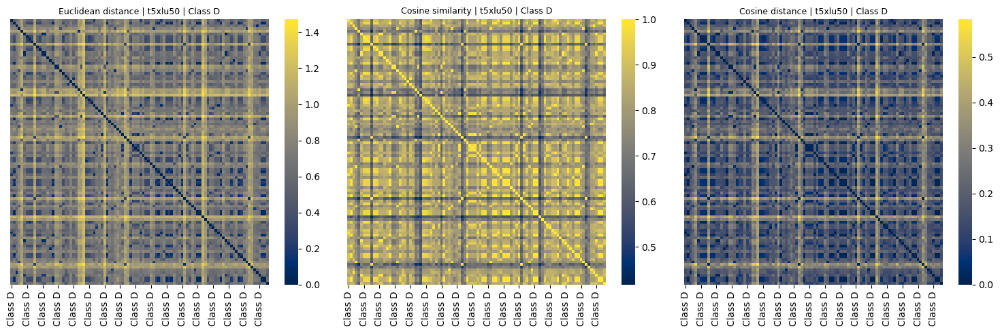

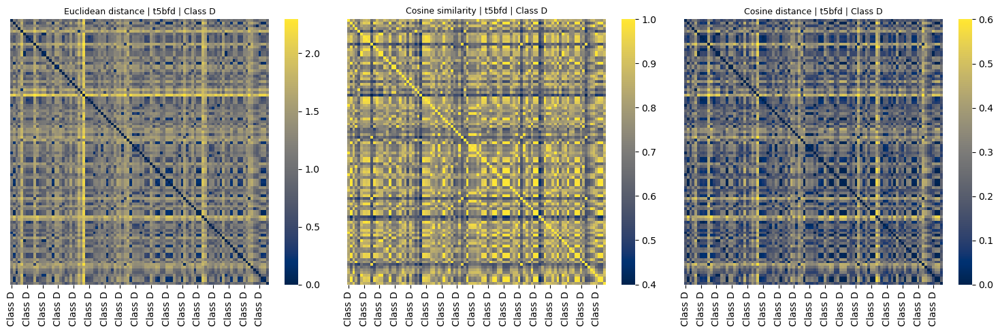

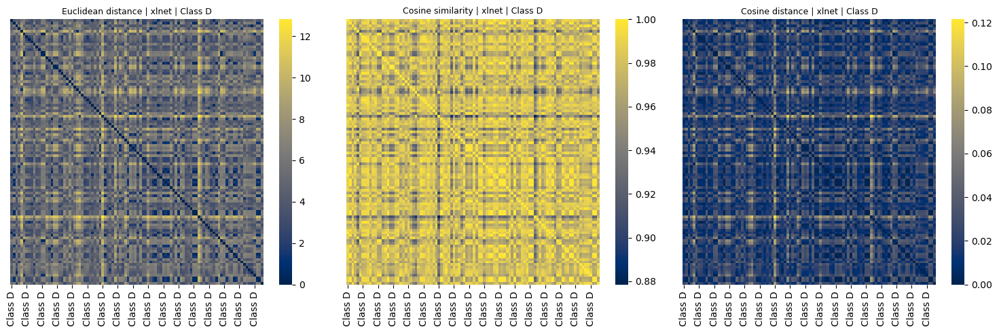

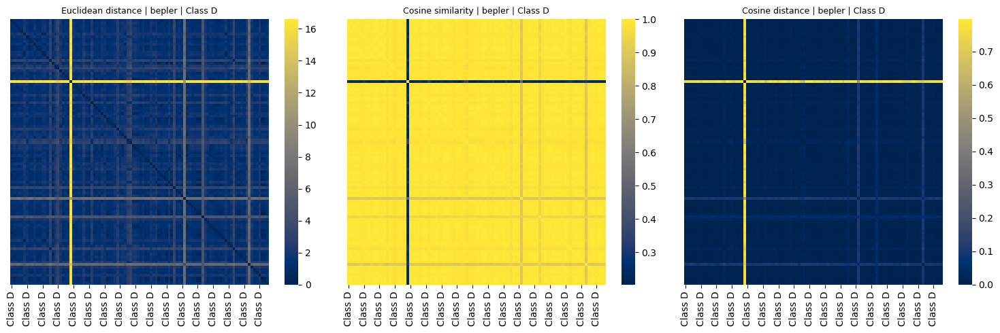

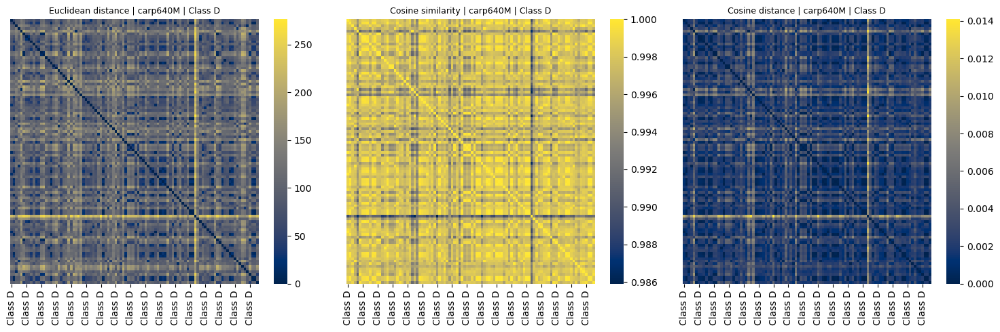

In [52]:
for model in models:
    plot_distance(rand100_d, model, "Class D")

# Clsutermap 

In [66]:
embeddings_esm1b = rand100_a.esm1b.to_numpy()
df_embeddings_esm1b = pd.DataFrame(embeddings_esm1b)
columnas = []
for i in range(1280):
    columna = df_embeddings_esm1b[0].apply(lambda x: x[i])
    columnas.append(columna)

df_nuevo = pd.concat(columnas, axis=1)
df_nuevo

,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0.116711,-0.015348,-0.054431,0.206968,-0.031739,-0.073027,-0.122240,0.124226,-0.065558,-0.104780,...,0.309034,0.025117,0.028465,-0.028010,-0.036592,-0.131728,0.102327,-0.119241,0.043746,0.074603
1,0.151874,-0.040870,-0.122276,0.270415,0.067303,-0.117558,-0.060268,0.137097,0.130134,-0.153659,...,0.334385,0.171274,-0.027012,-0.061386,-0.059490,-0.129349,0.096587,-0.097541,0.084793,0.084742
2,0.073877,-0.009097,-0.226529,0.329091,0.038233,-0.087339,-0.019589,0.096198,0.075405,-0.088024,...,0.289099,0.182038,-0.143703,0.053158,-0.089059,-0.182278,0.109219,-0.086350,0.055905,0.050114
3,0.083733,0.056688,-0.047591,0.073439,-0.012498,0.001826,-0.089667,0.100585,-0.064523,-0.178185,...,0.335617,-0.029480,-0.024113,0.027333,-0.126122,-0.041298,0.062837,-0.067123,-0.045802,0.052579
4,0.103285,-0.016011,-0.102218,0.238220,0.060323,-0.078227,-0.058883,0.090328,0.092608,-0.200171,...,0.346155,0.103022,-0.066213,-0.055248,0.031163,-0.161599,0.165450,-0.111480,0.061343,0.101999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.084759,0.062237,-0.063188,0.146413,0.048938,-0.067856,-0.092408,0.149716,-0.016323,-0.160029,...,0.283666,-0.010841,-0.042661,0.058667,-0.186385,-0.050231,0.092200,-0.046537,-0.022705,0.050723
96,0.056733,0.003186,0.049745,0.179182,-0.028360,-0.083375,-0.149219,0.120039,-0.060429,-0.214462,...,0.253466,0.074949,0.009348,-0.086265,0.093266,-0.166445,0.037764,-0.103116,0.009181,0.078728
97,0.155189,0.007058,-0.164343,0.312984,-0.122440,-0.064588,0.030018,0.084567,0.012833,0.007826,...,0.308871,0.054565,0.025736,0.004787,-0.272155,-0.068167,0.013256,-0.130392,-0.095103,0.052992
98,0.072655,0.060673,-0.101668,0.077001,-0.086344,-0.007422,-0.064705,0.118470,-0.062580,-0.139487,...,0.389346,-0.066619,-0.054064,0.035051,-0.117530,0.033294,0.132105,-0.067913,-0.092232,-0.037369


/home/gama/anaconda3/lib/python3.9/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


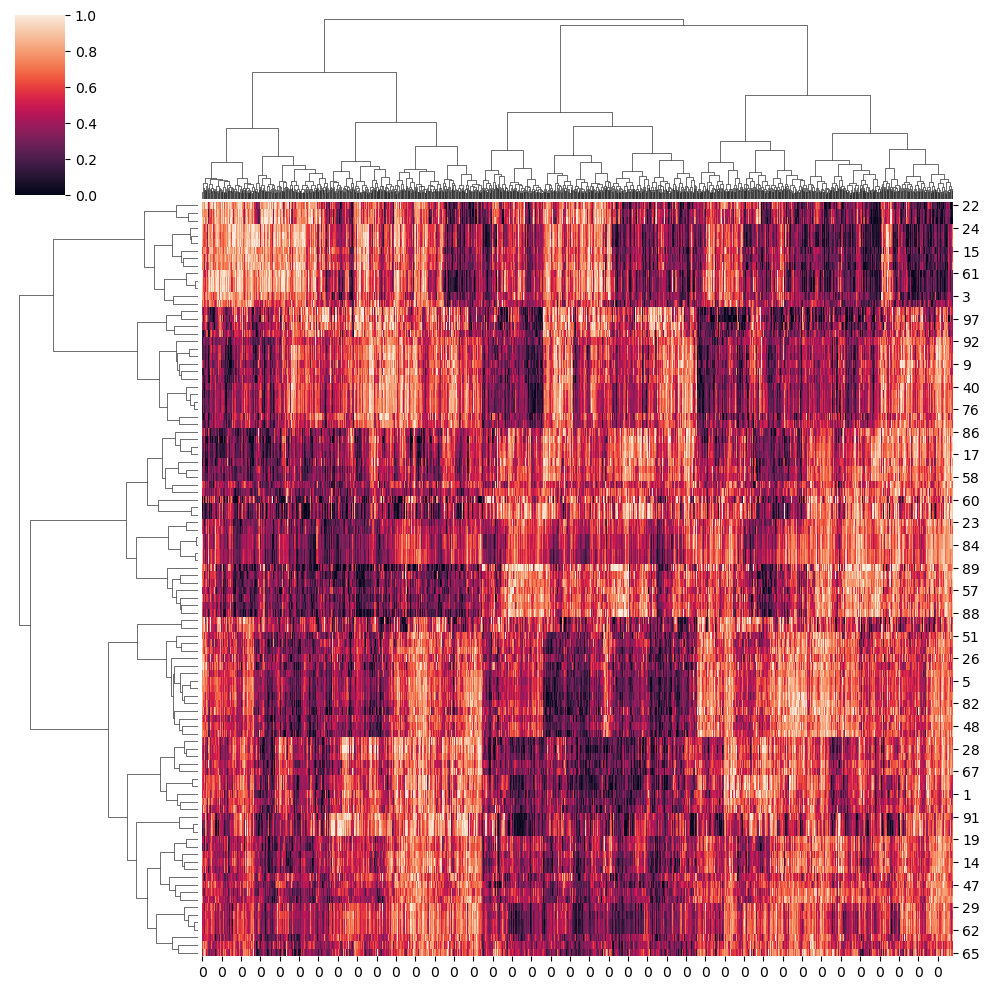

In [68]:
sns.clustermap(data = df_nuevo, method='ward', metric='euclidean', standard_scale=1)